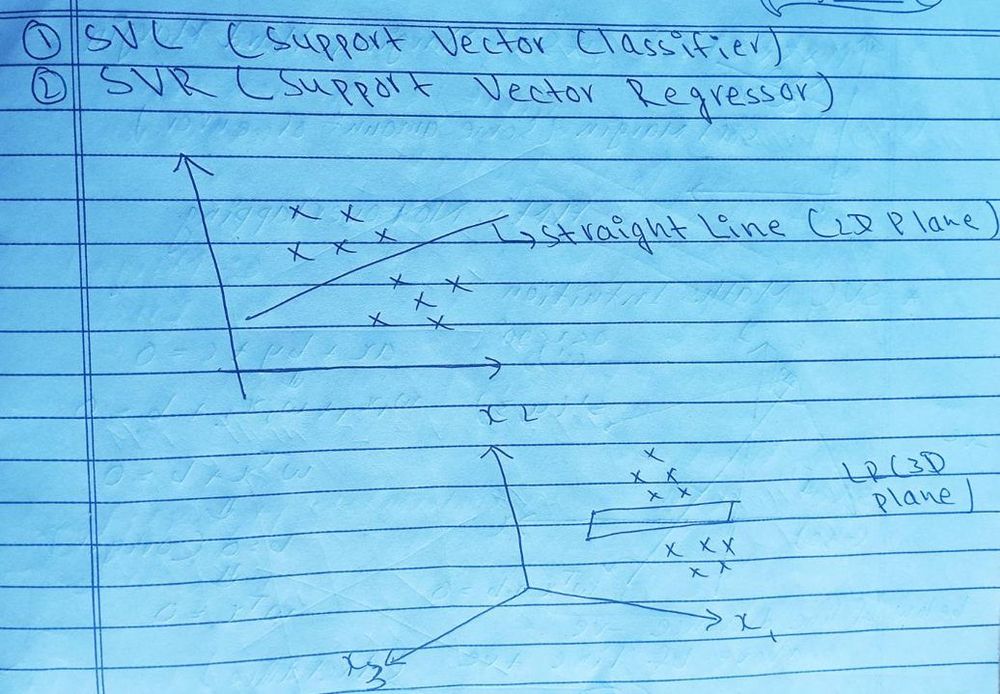

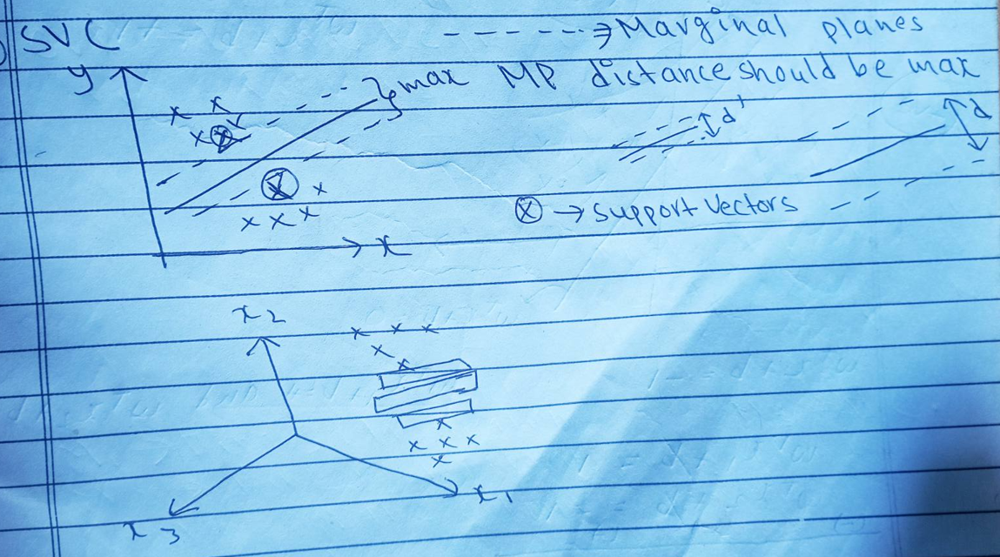

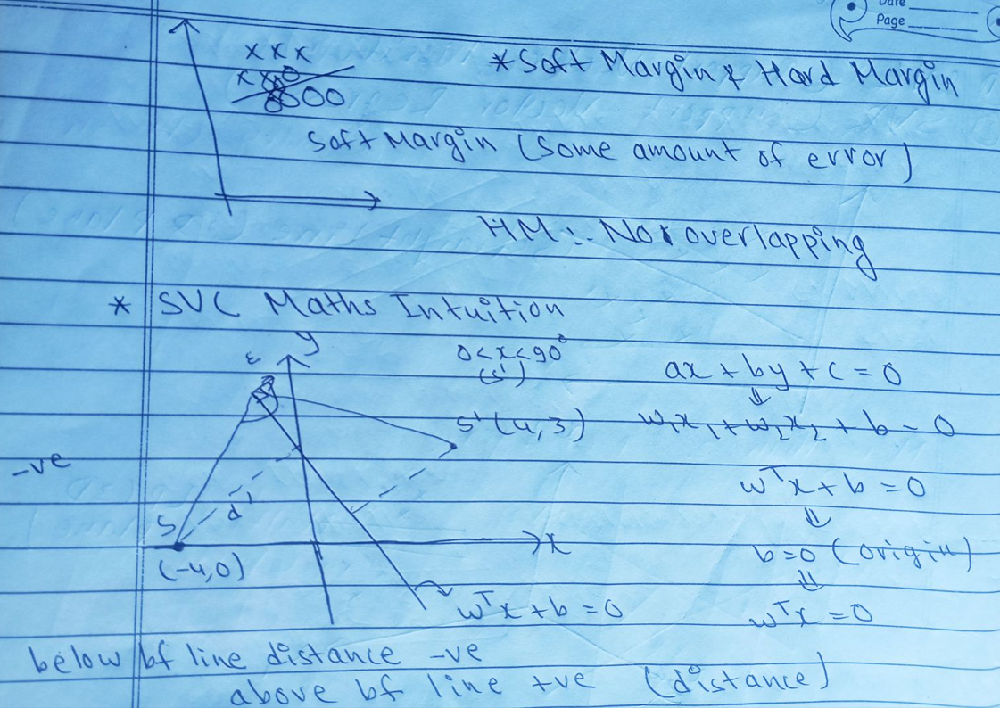

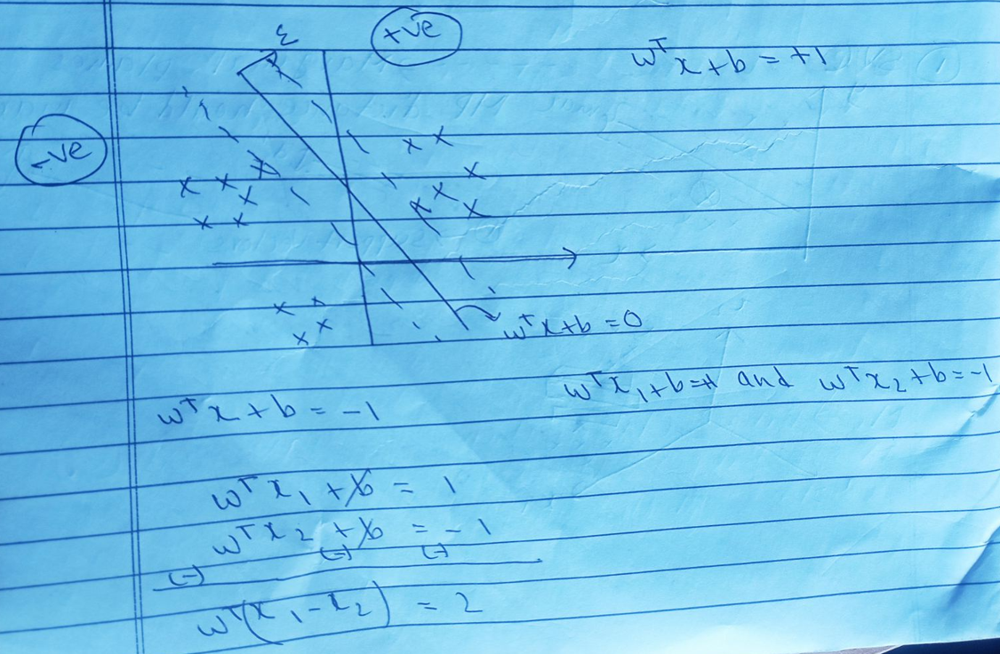

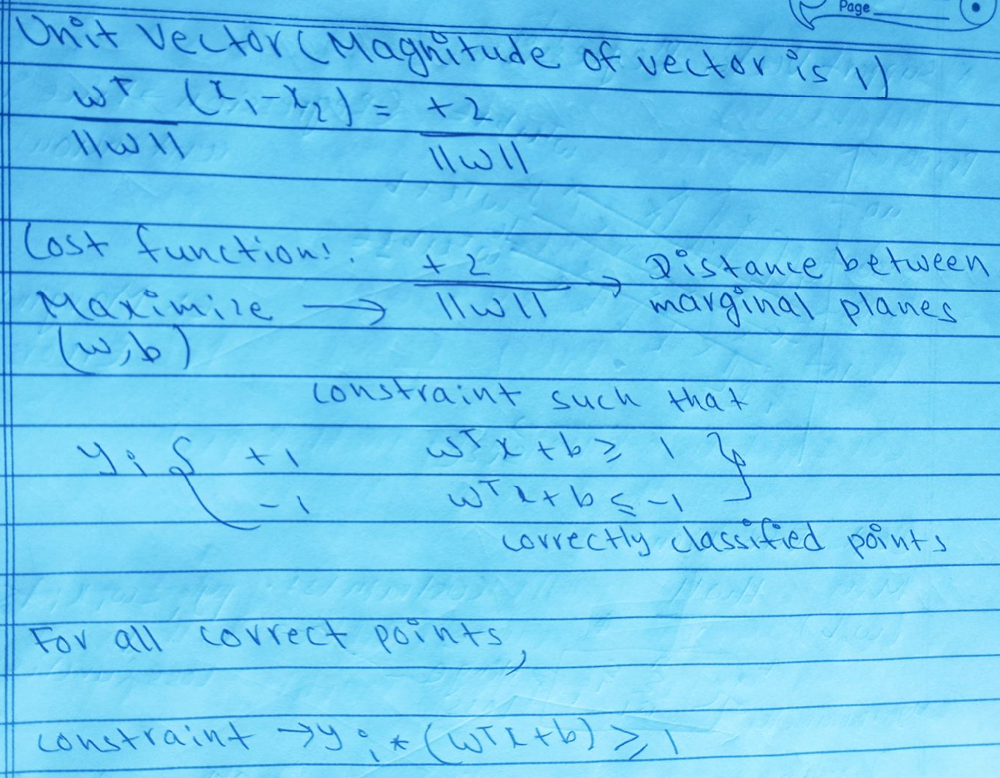

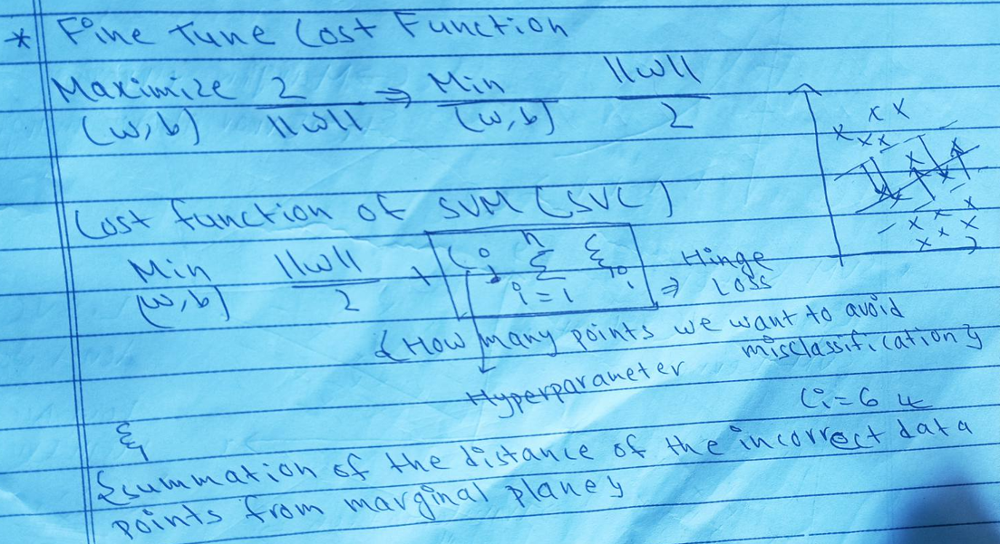

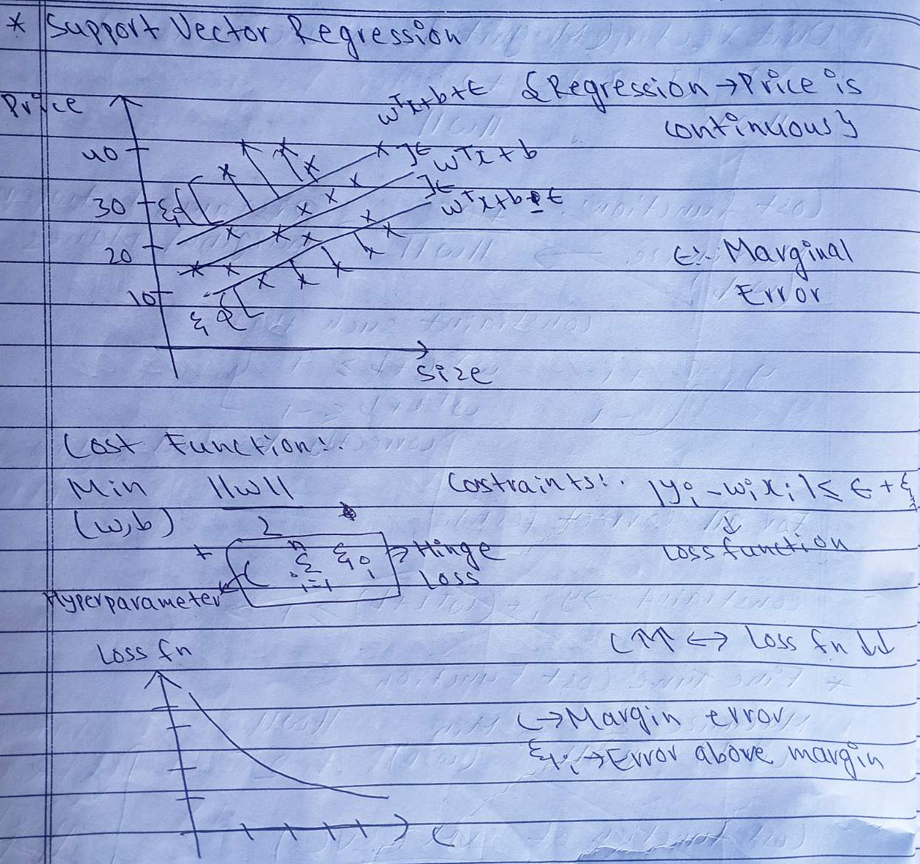

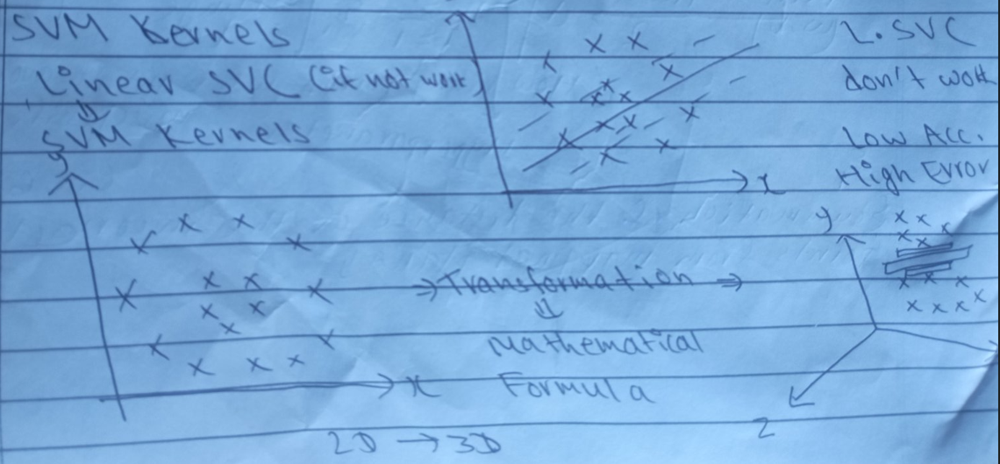

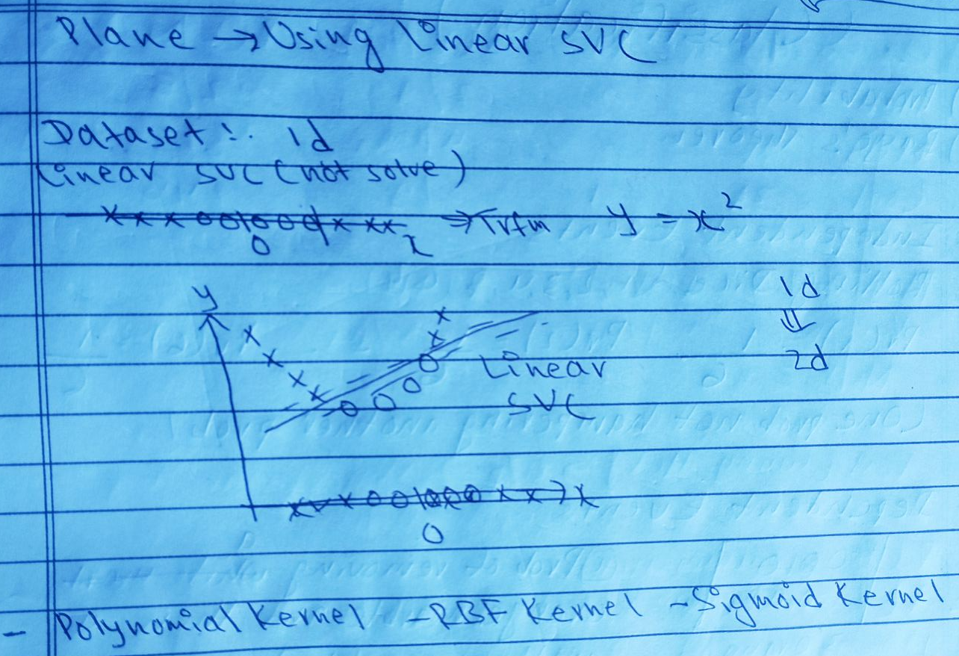

SVM is mainly used to classify things into categories.

For example: Is this email spam or not spam?


Hyperplane
 is the line (in 2D) or plane (in 3D) that splits the data into two groups.

The goal is to find the best line/plane that separates the data.

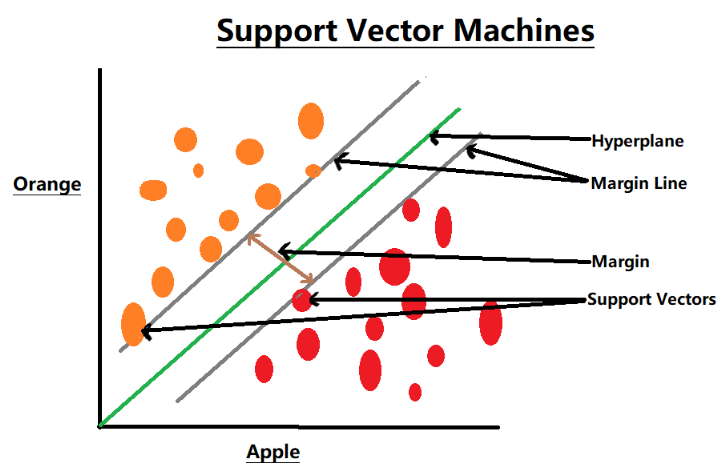

SVM doesn’t just draw any line.

It finds the one with the biggest gap (margin) between the two groups.

The idea is: more gap = better separation = better future predictions

Support Vectors are the closest data points to the line from each group.

They “support” the position of the hyperplane.

If we move them, the line will shift.

| Value of \( y_i(w^T x_i + b) \) | Position of Point         | Classification         |
|----------------------------------|----------------------------|--------------------------|
| > 1                             | Outside the margin         | Correct                 |
| = 1                             | On the margin              | Correct (Support Vector)|
| Between 0 and 1                 | Inside the margin          | Correct but weak        |
| < 0                             | On wrong side (misclass)  | Incorrect               |


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
## Synthetic data points
from sklearn.datasets import make_classification

In [ ]:
X, y = make_classification(n_samples = 1000, n_features = 2, n_classes = 2, n_clusters_per_class = 1, n_redundant = 0)

In [ ]:
X

array([[ 0.96572634, -1.52664191],
       [ 0.03599814,  0.63167691],
       [ 2.26382167, -1.70600749],
       ...,
       [-2.7217473 , -0.50546748],
       [-1.20742449,  1.1651062 ],
       [-0.08643166,  1.33628209]])

In [ ]:
y

array([0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1,
       1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,

In [ ]:
pd.DataFrame(X)

,0,1
0,0.965726,-1.526642
1,0.035998,0.631677
2,2.263822,-1.706007
3,-1.261428,-0.369284
4,-1.058584,-0.002915
...,...,...
995,-0.563577,1.393118
996,-2.507675,-0.653713
997,-2.721747,-0.505467
998,-1.207424,1.165106


In [ ]:
pd.DataFrame(X)[0]

,0
0,0.965726
1,0.035998
2,2.263822
3,-1.261428
4,-1.058584
...,...
995,-0.563577
996,-2.507675
997,-2.721747
998,-1.207424


In [ ]:
pd.DataFrame(X)[1]

,1
0,-1.526642
1,0.631677
2,-1.706007
3,-0.369284
4,-0.002915
...,...
995,1.393118
996,-0.653713
997,-0.505467
998,1.165106


<Axes: xlabel='0', ylabel='1'>

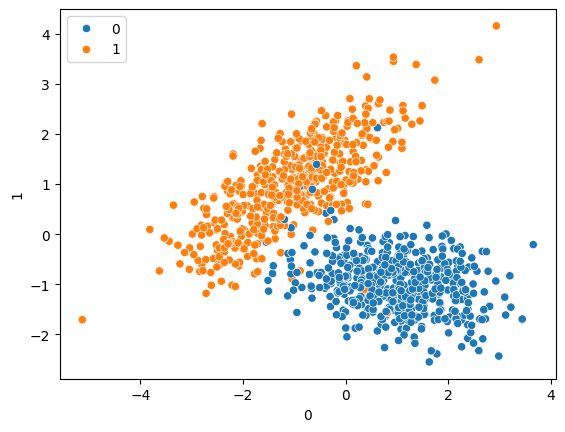

In [ ]:
sns.scatterplot(x = pd.DataFrame(X)[0], y = pd.DataFrame(X)[1], hue = y)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 10)

In [ ]:
from sklearn.svm import SVC

In [ ]:
model = SVC(kernel = 'linear')

In [ ]:
model.fit(X_train, y_train)

SVC(kernel='linear')

In [ ]:
## Predictions
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       117
           1       0.99      0.98      0.99       133

    accuracy                           0.99       250
   macro avg       0.99      0.99      0.99       250
weighted avg       0.99      0.99      0.99       250

[[116   1]
 [  2 131]]


In [ ]:
rbf = SVC(kernel = 'rbf')
rbf.fit(X_train, y_train)

SVC()

In [ ]:
## Predictions
y_pred1 = rbf.predict(X_test)

In [ ]:
print(classification_report(y_test, y_pred1))
print(confusion_matrix(y_test, y_pred1))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       117
           1       0.99      0.98      0.99       133

    accuracy                           0.99       250
   macro avg       0.99      0.99      0.99       250
weighted avg       0.99      0.99      0.99       250

[[116   1]
 [  2 131]]


In [ ]:
polynomial = SVC(kernel = 'poly')
polynomial.fit(X_train, y_train)
y_pred2 = polynomial.predict(X_test)
print(classification_report(y_test, y_pred2))
print(confusion_matrix(y_test, y_pred2))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       117
           1       0.99      0.95      0.97       133

    accuracy                           0.97       250
   macro avg       0.97      0.97      0.97       250
weighted avg       0.97      0.97      0.97       250

[[116   1]
 [  6 127]]


In [ ]:
sigmoid = SVC(kernel = 'sigmoid')
sigmoid.fit(X_train, y_train)
y_pred3 = sigmoid.predict(X_test)
print(classification_report(y_test, y_pred3))
print(confusion_matrix(y_test, y_pred3))

              precision    recall  f1-score   support

           0       0.90      0.94      0.92       117
           1       0.95      0.91      0.93       133

    accuracy                           0.92       250
   macro avg       0.92      0.92      0.92       250
weighted avg       0.92      0.92      0.92       250

[[110   7]
 [ 12 121]]


Hyperparameter Tuning with SVC

In [ ]:
from sklearn.model_selection import GridSearchCV

# Defining parameter range
param_grid = {'C' : [0.1, 1, 10, 100, 1000],
              'gamma' : [1, 0.1, 0.01, 0.001, 0.0001,'scale', 'auto'],
              'kernel' : ['rbf','linear', 'poly', 'sigmoid']
              }

In [ ]:
model = SVC()

In [ ]:
grid = GridSearchCV(model, param_grid = param_grid)

In [ ]:
grid.fit(X_train, y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001, 'scale',
                                   'auto'],
                         'kernel': ['rbf', 'linear', 'poly', 'sigmoid']})

In [ ]:
grid.best_params_

{'C': 100, 'gamma': 1, 'kernel': 'rbf'}

In [ ]:
rbf = SVC(kernel = 'rbf', C = 100, gamma = 1)
rbf.fit(X_train, y_train)

SVC(C=100, gamma=1)

In [ ]:
# Predictions
y_pred4 = rbf.predict(X_test)
print(classification_report(y_test, y_pred4))
print(confusion_matrix(y_test, y_pred4))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       117
           1       0.99      0.98      0.98       133

    accuracy                           0.98       250
   macro avg       0.98      0.98      0.98       250
weighted avg       0.98      0.98      0.98       250

[[116   1]
 [  3 130]]
